# Исследовательский анализ данных

In [1]:
pip install matplotlib plotly seaborn

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 24.0 -> 25.2
[notice] To update, run: C:\Users\anton\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip


In [2]:
# Импортируем библиотеки
import pandas as pd
import matplotlib.pyplot as plt
import plotly
import plotly.express as px
import seaborn as sns
import json
import ast
from scipy.stats import ttest_1samp
from scipy.stats import ttest_ind
from scipy.stats import ttest_rel

In [3]:
# Загружаем данные
accident = pd.read_csv('accidents_clean.csv', low_memory=False, parse_dates=['datetime'])
vehicle = pd.read_csv('vehicles_clean.csv')
participant = pd.read_csv('participants_clean.csv')

In [4]:
display(accident.head())
print(accident.info())

,id,light,point,region,address,category,datetime,severity,dead_count,injured_count,parent_region,participants_count,geometry,nearby
0,189548,Светлое время суток,"{ ""lat"": 49.789873999999998, ""long"": 129.84691...",Бурейский район,"Обход п. Бурея, 5 км",Наезд на пешехода,2019-04-05 14:10:00,Легкий,0,1,Амурская область,2,POINT (129.846919 49.789874),NaN
1,188700,"В темное время суток, освещение отсутствует","{ ""lat"": 49.755600000000001, ""long"": 129.29220...",Бурейский район,"Благовещенск – Гомелевка, 148 км",Столкновение,2022-11-16 22:50:00,С погибшими,1,1,Амурская область,3,POINT (129.2922 49.7556),NaN
2,188702,"В темное время суток, освещение не включено","{ ""lat"": 49.787187000000003, ""long"": 129.81648...",Бурейский район,"Обход п. Бурея, 2 км",Съезд с дороги,2019-12-27 23:50:00,Легкий,0,1,Амурская область,1,POINT (129.816481 49.787187),NaN
3,188704,"В темное время суток, освещение отсутствует","{ ""lat"": 49.135599999999997, ""long"": 129.1181 }",Бурейский район,"пгт Бурея, ул Райчихинская, 1",Наезд на пешехода,2016-12-30 19:10:00,С погибшими,1,0,Амурская область,2,POINT (129.1181 49.1356),NaN
4,188706,Светлое время суток,"{ ""lat"": 49.119199999999999, ""long"": 129.1353 }",Бурейский район,"пгт Новобурейский, ул Лесная, 22",Наезд на пешехода,2017-12-30 08:45:00,Легкий,0,1,Амурская область,2,POINT (129.1353 49.1192),NaN


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1465882 entries, 0 to 1465881
Data columns (total 14 columns):
 #   Column              Non-Null Count    Dtype         
---  ------              --------------    -----         
 0   id                  1465882 non-null  int64         
 1   light               1465882 non-null  object        
 2   point               1465882 non-null  object        
 3   region              1465882 non-null  object        
 4   address             1389322 non-null  object        
 5   category            1465882 non-null  object        
 6   datetime            1465882 non-null  datetime64[ns]
 7   severity            1465882 non-null  object        
 8   dead_count          1465882 non-null  int64         
 9   injured_count       1465882 non-null  int64         
 10  parent_region       1465882 non-null  object        
 11  participants_count  1465882 non-null  int64         
 12  geometry            1456071 non-null  object        
 13  nearby      

In [5]:
display(vehicle.head())
print(vehicle.info())

,year,brand,color,model,category,accident_id,vehicle_age
0,2005,TOYOTA,Серый,Paseo,"С-класс (малый средний, компактный) до 4,3 м",189548,20
1,1993,TOYOTA,Белый,Corona,Прочие легковые автомобили,188700,32
2,1988,ISUZU,Синий,Прочие модели Isuzu,Фургоны,188700,37
3,2008,TOYOTA,Белый,Prius,"D-класс (средний) до 4,6 м",188702,17
4,1989,TOYOTA,Белый,Ipsum,"D-класс (средний) до 4,6 м",188704,36


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2224003 entries, 0 to 2224002
Data columns (total 7 columns):
 #   Column       Dtype 
---  ------       ----- 
 0   year         int64 
 1   brand        object
 2   color        object
 3   model        object
 4   category     object
 5   accident_id  int64 
 6   vehicle_age  int64 
dtypes: int64(3), object(4)
memory usage: 118.8+ MB
None


In [6]:
display(participant.head())
print(participant.info())

,role,gender,violations,health_status,accident_id
0,Пешеход,Мужской,['Нахождение на проезжей части без цели её пер...,"Раненый, находящийся (находившийся) на амбула...",189548
1,Пешеход,Мужской,['Нахождение на проезжей части без цели её пер...,Скончался в течение 1 суток,188704
2,Пешеход,Женский,[],"Раненый, находящийся (находившийся) на амбула...",188706
3,Пешеход,Женский,['Нахождение на проезжей части без цели её пер...,"Раненый, находящийся (находившийся) на стацион...",188709
4,Пешеход,Женский,['Переход через проезжую часть вне пешеходного...,"Раненый, находящийся (находившийся) на амбулат...",188711


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 455224 entries, 0 to 455223
Data columns (total 5 columns):
 #   Column         Non-Null Count   Dtype 
---  ------         --------------   ----- 
 0   role           455224 non-null  object
 1   gender         455224 non-null  object
 2   violations     455224 non-null  object
 3   health_status  455224 non-null  object
 4   accident_id    455224 non-null  int64 
dtypes: int64(1), object(4)
memory usage: 17.4+ MB
None


Добавим две колонки с широтой и долготой.

In [7]:
# Из колонки point сделаем две колонки с координатами
accident['lat'] = accident['point'].apply(
    lambda x: json.loads(x)['lat'] if pd.notnull(x) else None
)
accident['lon'] = accident['point'].apply(
    lambda x: json.loads(x)['long'] if pd.notnull(x) else None
)

print(accident[['lat', 'lon']].head())

         lat         lon
0  49.789874  129.846919
1  49.755600  129.292200
2  49.787187  129.816481
3  49.135600  129.118100
4  49.119200  129.135300


In [8]:
print(accident.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1465882 entries, 0 to 1465881
Data columns (total 16 columns):
 #   Column              Non-Null Count    Dtype         
---  ------              --------------    -----         
 0   id                  1465882 non-null  int64         
 1   light               1465882 non-null  object        
 2   point               1465882 non-null  object        
 3   region              1465882 non-null  object        
 4   address             1389322 non-null  object        
 5   category            1465882 non-null  object        
 6   datetime            1465882 non-null  datetime64[ns]
 7   severity            1465882 non-null  object        
 8   dead_count          1465882 non-null  int64         
 9   injured_count       1465882 non-null  int64         
 10  parent_region       1465882 non-null  object        
 11  participants_count  1465882 non-null  int64         
 12  geometry            1456071 non-null  object        
 13  nearby      

Мы видим, что после добавления колонок с координатами, появились пропуски. Возможно, в колонке `point` некоторые строки были неправильно записаны, содержат пустые строки или содержат `null` вместо координат.

In [9]:
invalid_points = accident[accident['lat'].isna() | accident['lon'].isna()]['point'].head(20)
print(invalid_points)

400     { "lat": null, "long": null }
724     { "lat": null, "long": null }
729     { "lat": null, "long": null }
946     { "lat": null, "long": null }
1091    { "lat": null, "long": null }
1107    { "lat": null, "long": null }
1128    { "lat": null, "long": null }
1132    { "lat": null, "long": null }
1136    { "lat": null, "long": null }
1140    { "lat": null, "long": null }
1144    { "lat": null, "long": null }
1148    { "lat": null, "long": null }
1152    { "lat": null, "long": null }
1153    { "lat": null, "long": null }
1156    { "lat": null, "long": null }
1158    { "lat": null, "long": null }
1160    { "lat": null, "long": null }
1163    { "lat": null, "long": null }
1166    { "lat": null, "long": null }
1167    { "lat": null, "long": null }
Name: point, dtype: object


Мы решили оставить пропуски, чтобы не допустить неточностей при последующем анализе.

### Корреляционный анализ

Посмотрим, как связаны:
- кол-во участников и кол-во пострадавших
- возраст машины и тяжесть ДТП

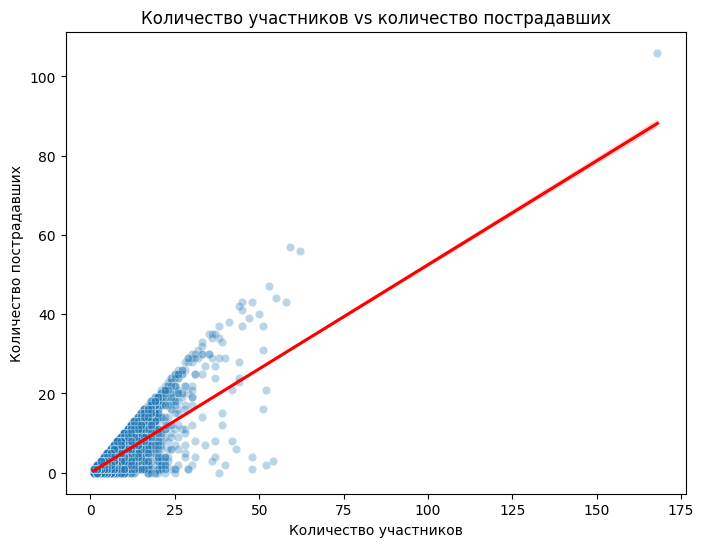

In [10]:
# Зависимость кол-ва участников от кол-ва пострадавших
plt.figure(figsize=(8,6))
sns.scatterplot(
    x='participants_count', 
    y='injured_count', 
    data=accident, 
    alpha=0.3
)
sns.regplot(
    x='participants_count', 
    y='injured_count', 
    data=accident, 
    scatter=False, 
    color='red'
)
plt.title('Количество участников vs количество пострадавших')
plt.xlabel('Количество участников')
plt.ylabel('Количество пострадавших')
plt.show()

In [11]:
corr1 = accident[['participants_count', 'injured_count']].corr().iloc[0,1]
print(f'Корреляция между количеством участников и количеством пострадавших: {corr1:.2f}')

Корреляция между количеством участников и количеством пострадавших: 0.70


Высокая положительная корреляция указывает на то, что чем больше участников в ДТП, тем выше риск получения травм.

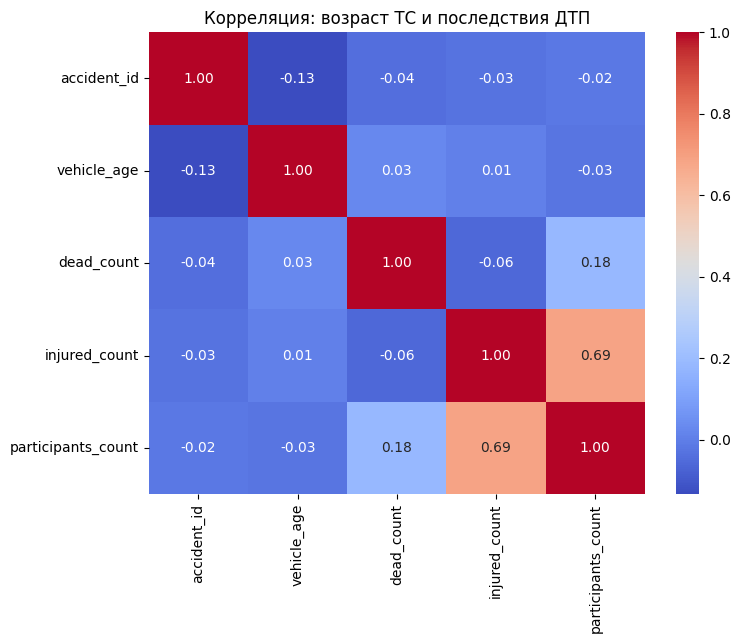

In [12]:
merged = vehicle[['accident_id', 'vehicle_age']].merge(
    accident[['id', 'dead_count', 'injured_count', 'participants_count']],
    left_on='accident_id', right_on='id'
)

# Удаляем лишнюю колонку id
merged.drop(columns='id', inplace=True)

plt.figure(figsize=(8, 6))
sns.heatmap(merged.corr(), annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Корреляция: возраст ТС и последствия ДТП')
plt.show()

Сильная зависимость есть только между количеством участников и количеством пострадавших.

#### Временной анализ ДТП. Построим распределение по часам суток, дням недели и месяцам.

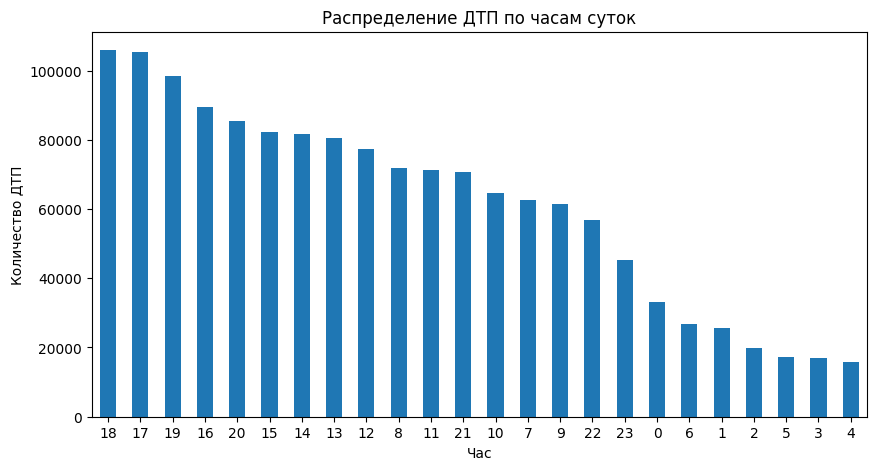

In [13]:
# Добавим новые колонки
accident['hour'] = accident['datetime'].dt.hour
accident['weekday'] = accident['datetime'].dt.day_name()
accident['month'] = accident['datetime'].dt.month_name()

# ДТП по часам
plt.figure(figsize=(10,5))
accident['hour'].value_counts().sort_values(ascending=False).plot(kind='bar')
plt.title('Распределение ДТП по часам суток')
plt.xlabel('Час')
plt.ylabel('Количество ДТП')
plt.xticks(rotation=0)
plt.show()


Чаще всего ДТП происходит в час пик в 17-18 часов. Вероятно, в это время люди заканчивают работать и торопятся домой.

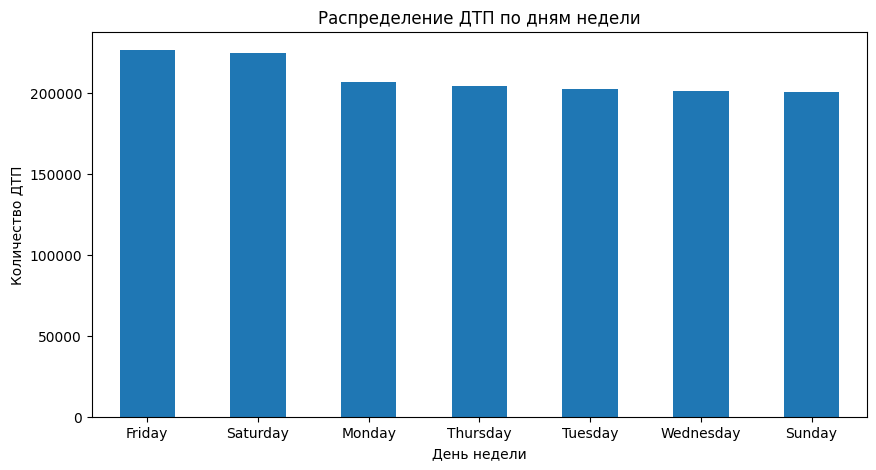

In [14]:
# ДТП по дням недели
plt.figure(figsize=(10,5))
accident['weekday'].value_counts().sort_values(ascending=False).plot(kind='bar')
plt.title('Распределение ДТП по дням недели')
plt.xlabel('День недели')
plt.ylabel('Количество ДТП')
plt.xticks(rotation=0)
plt.show()

Больше всего ДТП происходит в пятницу. Зачастую это последний рабочий день, как правило, люди не только торопятся приехать с работы домой, но и на выходные едут отдыхать за город или в какую-нибудь поездку.

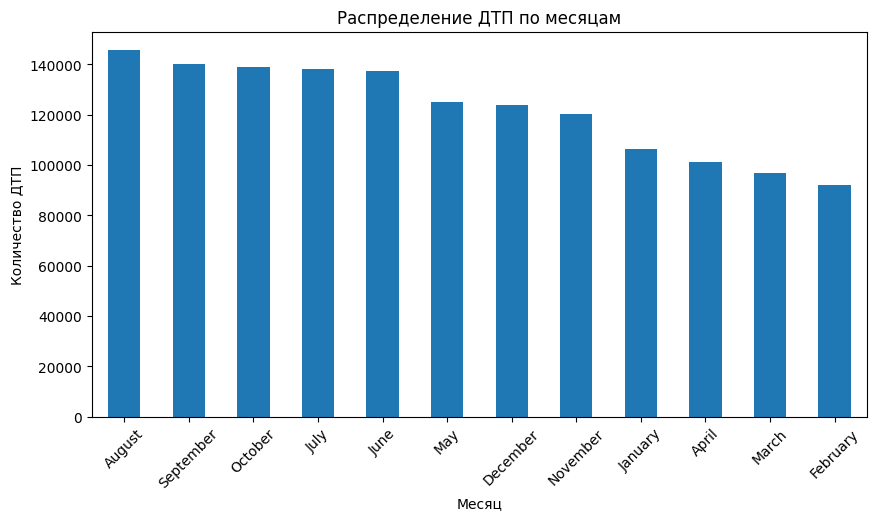

In [15]:
# ДТП по месяцам
plt.figure(figsize=(10,5))
accident['month'].value_counts().sort_values(ascending=False).plot(kind='bar')
plt.title('Распределение ДТП по месяцам')
plt.xlabel('Месяц')
plt.ylabel('Количество ДТП')
plt.xticks(rotation=45)
plt.show()

Август стал лидером по количеству ДТП. Это можно объяснить тем, что много людей берут отпуск в августе. Возможно, в этом месяце становится больше поездок на машине, например, путешествие своим ходом или по магазинам. Еще причиной может послужить ухудшение погодных условий, дождливая погода, поэтому после августа занимают места сентябрь и октябрь.

Посмотрим, сколько ДТП происходит по конкректным категориям. Возьмем топ-10 категорий.

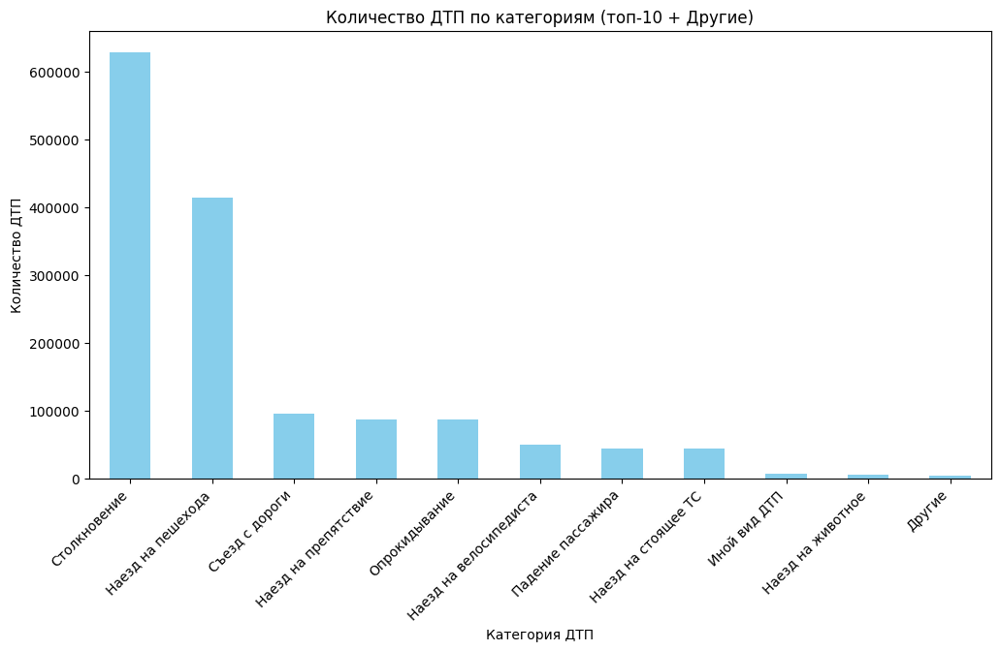

In [16]:
# Берём топ-10 категорий
top_categories = accident['category'].value_counts().head(10).index
accident['category_top'] = accident['category'].apply(lambda x: x if x in top_categories else 'Другие')

# Строим столбчатый график
plt.figure(figsize=(12,6))
accident['category_top'].value_counts().sort_values(ascending=False).plot(kind='bar', color='skyblue')
plt.title('Количество ДТП по категориям (топ-10 + Другие)')
plt.xlabel('Категория ДТП')
plt.ylabel('Количество ДТП')
plt.xticks(rotation=45, ha='right')
plt.show()

Чаще всего происходит столкновение ТС и наезд на пешехода.

Теперь посмотрим на распределение тяжести ДТП по топу категорий.

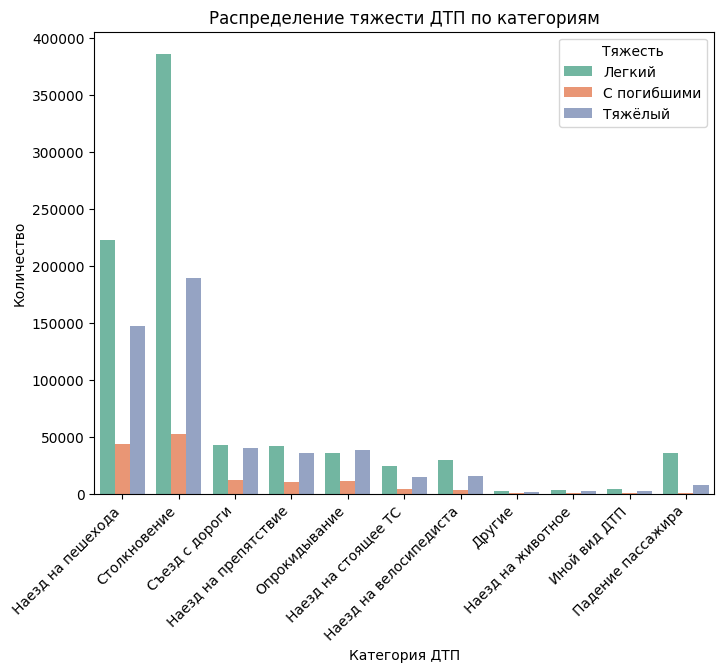

In [17]:
plt.figure(figsize=(8, 6))
sns.countplot(data=accident, x='category_top', hue='severity', palette='Set2')
plt.title('Распределение тяжести ДТП по категориям')
plt.xlabel('Категория ДТП')
plt.ylabel('Количество')
plt.xticks(rotation=45, ha='right')
plt.legend(title='Тяжесть')
plt.show()

Чаще всего происходят легкие столкновения или наезды на пешеходов. Реже происходит ДТП с погибшими, но ДТП с тяжелыми травмами и столкновениями больше.

Построим график влияния возраста ТС по топу категорий ДТП.

In [18]:
# Объединяем таблицы
merged = vehicle.merge(
    accident[['id', 'dead_count', 'category']],  # берем нужные колонки из accident
    left_on='accident_id',
    right_on='id',
    how='left'
)

# Проверяем, как называется колонка category
print(merged.columns)

Index(['year', 'brand', 'color', 'model', 'category_x', 'accident_id',
       'vehicle_age', 'id', 'dead_count', 'category_y'],
      dtype='object')


In [19]:
# Если после merge она называется 'category_y', переименуем
if 'category_y' in merged.columns:
    merged.rename(columns={'category_y': 'category'}, inplace=True)

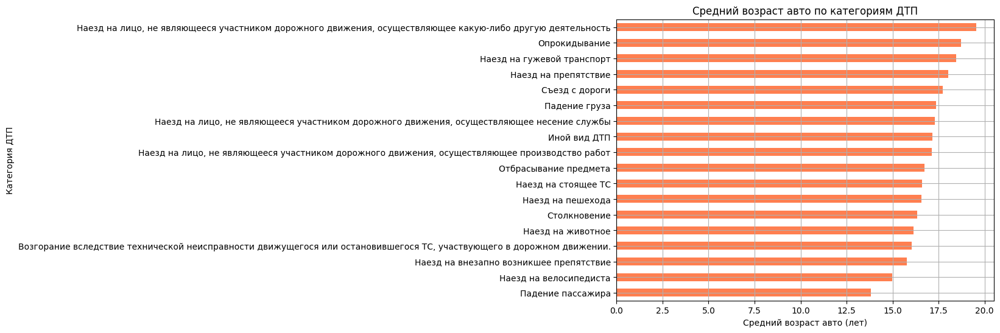

In [20]:
avg_vehicle_age = merged.groupby('category')['vehicle_age'].mean().sort_values()

plt.figure(figsize=(8, 6))
avg_vehicle_age.plot(kind='barh', color='coral', grid=True)
plt.title('Средний возраст авто по категориям ДТП')
plt.xlabel('Средний возраст авто (лет)')
plt.ylabel('Категория ДТП')
plt.show()

Самые старые автомобили (в среднем около 20 лет) участвуют в ДТП при наезде на лицо, не являющееся участником дорожного движения, осуществляющее какую-либо другую деятельность. Высокий средний возраст машин (18–19 лет) также наблюдается в авариях с опрокидыванием и наездами на гужевой транспорт. В категориях «наезд на препятствие» и «съезд с дороги» автомобили в среднем также достаточно старые — около 18 лет. Более новые автомобили (средний возраст 14–15 лет) участвуют в ДТП, связанных с падением пассажира, наездами на велосипедистов или внезапно возникшие препятствия.

Посмотрим на распределение участников по ролям и полу.

In [21]:
# Создадим новую колонку с сокращёнными ролями
participant['role_short'] = participant['role'].apply(lambda x: 'Пешеход' if 'Пешеход' in x else 'Другие')

# Строим histogram
fig = px.histogram(
    participant,
    x='role_short',
    color='gender',
    barmode='group',
    title='Распределение участников ДТП по ролям и полу (акцент на пешеходах)',
    labels={'role_short':'Роль участника', 'gender':'Пол'},
)

# Настраиваем легенду и подписи осей
fig.update_layout(
    xaxis_title='Роль участника',
    yaxis_title='Количество участников',
    legend_title='Пол',
    title_x=0.5
)

fig.show()

Больше всего женщины попадают в ДТП в роли пешехода (свыше 220 000 человек). Мужчин-перешеходов в ДТП немного меньше (213 000 человек).

Построим гистограмму, показывающую смертность и травматизм по категориям.

<Figure size 800x600 with 0 Axes>

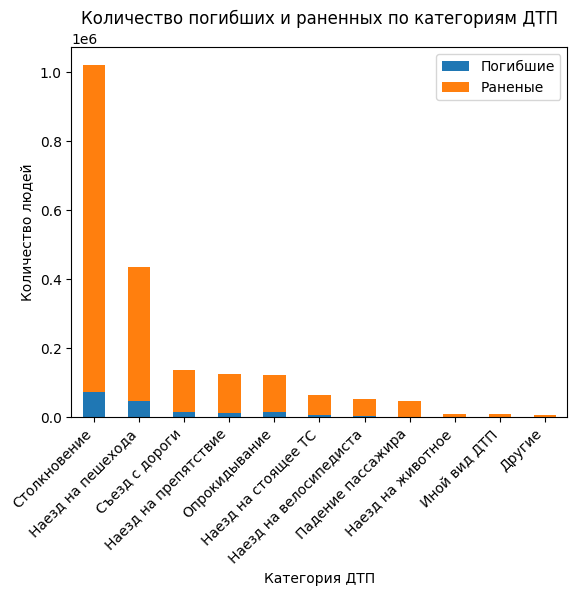

In [22]:
plt.figure(figsize=(8,6))
pupu = accident.groupby('category_top')[['dead_count', 'injured_count']].sum()

# Переименовываем колонки для легенды
pupu = pupu.rename(columns={'dead_count': 'Погибшие', 'injured_count': 'Раненые'})

# Отдельная колонка с общим количеством людей для сортировки
pupu['total'] = pupu['Погибшие'] + pupu['Раненые']

# Сортируем по убыванию
pupu = pupu.sort_values(by='total', ascending=False)

# Строим гистограмму по двум колонкам
pupu[['Погибшие', 'Раненые']].plot(kind='bar', stacked=True) # накладываем стобики друг на друга
plt.title('Количество погибших и раненных по категориям ДТП')
plt.xlabel('Категория ДТП')
plt.ylabel('Количество людей')
plt.xticks(rotation=45, ha='right') # выравниваем текст по правому краю
plt.show()

In [23]:
pupu[['Погибшие','Раненые']].sum()

Погибшие     165251
Раненые     1854475
dtype: int64

При столкновении больше всего людей погибло (около 100 000 человек), в то время как получивших травмы свыше 1 млн. При наезде на пешехода травмы получили 400 000 человек, погибло - около 50 000.

Посмотрим, какие марки чаще всего попадают в аварию.

In [24]:
# Возьмем топ-10 брендов авто
top_brands = vehicle['brand'].value_counts().head(10)
fig = px.bar(top_brands, x=top_brands.index, y=top_brands.values,
             title='Топ-10 брендов автомобилей по количеству ДТП',
             labels={'x':'Бренд', 'y':'Количество ДТП'})
fig.show()


Лидером по количеству ДТП стала марка ВАЗ (около 500 тысяч ДТП). Такое количество ДТП одной марки может объясняться высокой долей этих автомобилей в стране. На втором и третьем местах TOYOTA (почти 200 тыс.) и HYUNDAI (113 тыс.), что говорит об их популярности на дорогах.

Теперь проанализируем средний возраст авто по бренду.

In [25]:
# Считаем средний возраст авто по бренду
avg_age_brand = vehicle.groupby('brand')['vehicle_age'].mean().sort_values(ascending=False).head(10)

fig = px.bar(avg_age_brand, x=avg_age_brand.index, y=avg_age_brand.values,
             title='Средний возраст авто по бренду (топ-10)',
             labels={'x':'Бренд', 'y':'Средний возраст'})
fig.show()

Лидером по среднему возрасту стал мотоциклетный бренд DNEPR (около 39 лет). Далее идут DAIMLER (~36 лет) и ВОСХОД (~34 года). ИЖ, JAWA-CZ, ЗИЛ и NEOPLAN имеют самые «молодые» автомобили в этом топе — около 30 лет. В топ вошли старейшие бренды, автомобили которых давно выпускаются и часто не обновляются. Это говорит об эксплуатации преимущественно старых моделей, что может влиять на уровень безопасности и техническое состояние ТС.

Посмотрим на количество участников с нарушениями ПДД по категориям ДТП.

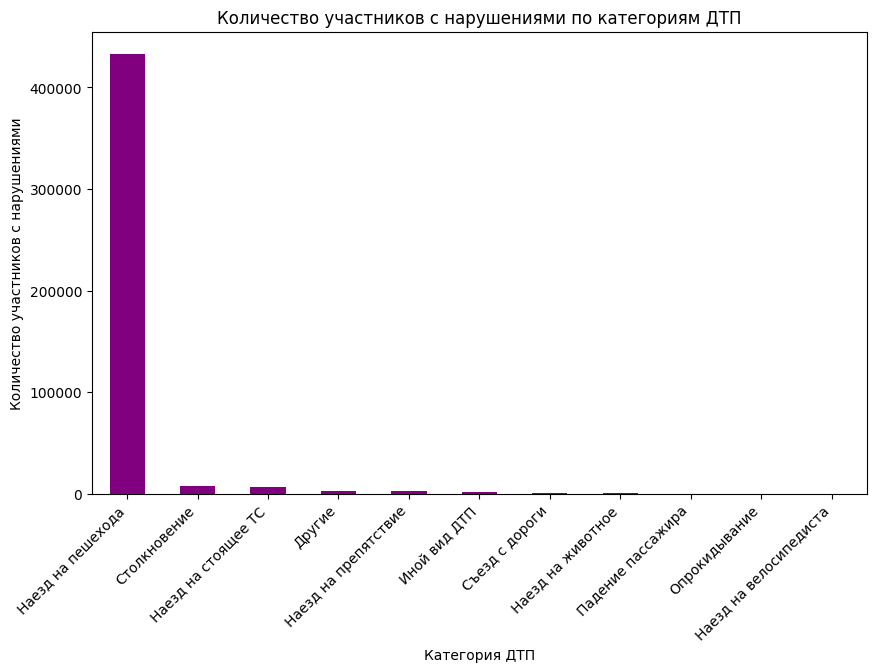

In [26]:
# Создадим индикатор наличия нарушений
participant['has_violations'] = participant['violations'].apply(lambda x: 1 if len(x)>0 else 0)

# Объединим данные двух таблиц (участников и ДТП)
merged_part = participant.merge(accident[['id','category_top']], left_on='accident_id', right_on='id')

# Посчитаем количество нарушений по категориям
violations_per_category = merged_part.groupby('category_top')['has_violations'].sum().sort_values(ascending=False)

plt.figure(figsize=(10,6))
violations_per_category.plot(kind='bar', color='purple')
plt.title('Количество участников с нарушениями по категориям ДТП')
plt.xlabel('Категория ДТП')
plt.ylabel('Количество участников с нарушениями')
plt.xticks(rotation=45, ha='right')
plt.show()

Больше всего имеют нарушения участники ДТП категории "Наезд на пешехода". Это может говорить о невнимательности или незнании ПДД как со стороны водителя, так и со стороны пешехода.

Проанализируем участников ДТП с нарушениями по полу.

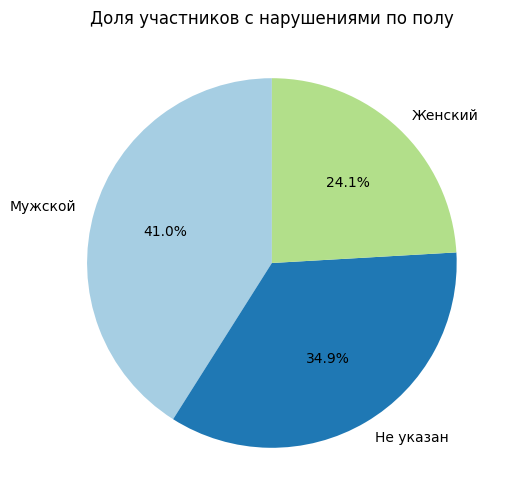

In [27]:
# Проверяем и исправляем формат колонки violations
# Если значения хранятся в виде строки (например, "['нарушение']"), переводим их в списки
participant['violations'] = participant['violations'].apply(
    lambda x: ast.literal_eval(x) if isinstance(x, str) else x
)

# Создаем флаг has_violations (1 - есть нарушения, 0 - нет)
participant['has_violations'] = participant['violations'].apply(
    lambda x: 1 if len(x) > 0 else 0
)

# Группируем данные по полу и считаем долю нарушителей
violations_by_gender = (
    participant.groupby('gender')['has_violations']
    .mean()
    .sort_values(ascending=False)
)

# Строим круговую диаграмму
plt.figure(figsize=(6, 6))
violations_by_gender.plot(
    kind='pie',
    autopct='%1.1f%%',  # проценты с одним знаком после запятой
    startangle=90,
    colors=plt.cm.Paired.colors
)
plt.title('Доля участников с нарушениями по полу')
plt.ylabel('')  # убираем подпись оси Y
plt.show()

Основную долю участников в ДТП с нарушениями занимают мужчины (41%), далее идут лица с неуказанным полом (около 35%) и женщины (24%).

Посмотрим на статусы здоровья участников ДТП.

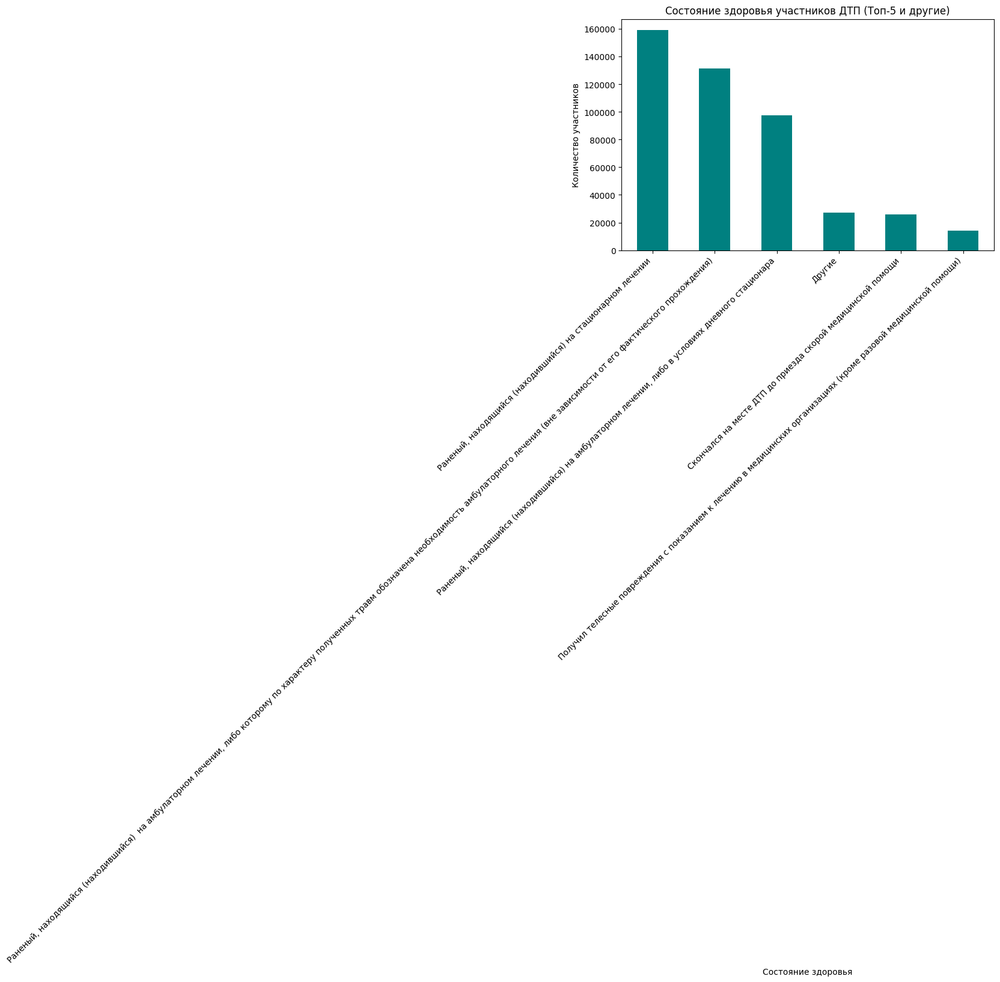

In [28]:
# Получаем топ-5 статусов
top_5_statuses = participant['health_status'].value_counts().nlargest(5).index

# Создаем новую колонку с группировкой
participant['health_status_grouped'] = participant['health_status'].apply(
    lambda x: x if x in top_5_statuses else 'Другие'
)

# Строим график только для топ-5 + "Другие"
plt.figure(figsize=(8, 5))
participant['health_status_grouped'].value_counts().plot(
    kind='bar',
    color='teal'
)
plt.title('Состояние здоровья участников ДТП (Топ-5 и другие)')
plt.ylabel('Количество участников')
plt.xlabel('Состояние здоровья')
plt.xticks(rotation=45, ha='right')
plt.show()

Большая часть участников ДТП получили статус здоровья "Раненный, находящийся (находившийся) на стационарном лечении (около 160 тыс. человек). Меньше всего участников (около 20 тыс.) имеют состояние здоровья "Получил телесные повреждения с показанием к лечению в медицинских организациях (кроме разовой мед. помощи)".

Вывод:
- Из колонки `point` получили две колонки с широтой `lat` и долготой `lon`.
- Провели корреляционный анализ:
    - Высокая положительная корреляция указывает на то, что чем больше участников в ДТП, тем выше риск получения травм.
    - Сильная зависимость есть только между количеством участников и количеством пострадавших.
- Провели временной анализ ДТП:
    - Чаще всего ДТП происходит в час пик в 17-18 часов. Вероятно, в это время люди заканчивают работать и торопятся домой.
    - Больше всего ДТП происходит в пятницу. Зачастую это последний рабочий день, как правило, люди не только торопятся приехать с работы домой, но и на выходные едут отдыхать за город или в какую-нибудь поездку.
    - Август стал лидером по количеству ДТП. Это можно объяснить тем, что много людей берут отпуск в августе. Возможно, в этом месяце становится больше поездок на машине, например, путешествие своим ходом или по магазинам. Еще причиной может послужить ухудшение погодных условий, дождливая погода, поэтому после августа занимают места сентябрь и октябрь.
- Чаще всего происходит столкновение ТС и наезд на пешехода.
- Чаще всего происходят легкие столкновения или наезды на пешеходов. Реже происходит ДТП с погибшими, но ДТП с тяжелыми травмами и столкновениями больше.
- Самые старые автомобили (в среднем около 20 лет) участвуют в ДТП при наезде на лицо, не являющееся участником дорожного движения, осуществляющее какую-либо другую деятельность. Высокий средний возраст машин (18–19 лет) также наблюдается в авариях с опрокидыванием и наездами на гужевой транспорт. В категориях «наезд на препятствие» и «съезд с дороги» автомобили в среднем также достаточно старые — около 18 лет. Более новые автомобили (средний возраст 14–15 лет) участвуют в ДТП, связанных с падением пассажира, наездами на велосипедистов или внезапно возникшие препятствия.
- Больше всего женщины попадают в ДТП в роли пешехода (свыше 220 000 человек). Мужчин-перешеходов в ДТП немного меньше (213 000 человек).
- При столкновении больше всего людей погибло (около 100 000 человек), в то время как получивших травмы свыше 1 млн. При наезде на пешехода травмы получили 400 000 человек, погибло - около 50 000.
- Лидером по количеству ДТП стала марка ВАЗ (около 500 тысяч ДТП). Такое количество ДТП одной марки может объясняться высокой долей этих автомобилей в стране. На втором и третьем местах TOYOTA (почти 200 тыс.) и HYUNDAI (113 тыс.), что говорит об их популярности на дорогах.
- Лидером по среднему возрасту стал мотоциклетный бренд DNEPR (около 39 лет). Далее идут DAIMLER (~36 лет) и ВОСХОД (~34 года). ИЖ, JAWA-CZ, ЗИЛ и NEOPLAN имеют самые «молодые» автомобили в этом топе — около 30 лет. В топ вошли старейшие бренды, автомобили которых давно выпускаются и часто не обновляются. Это говорит об эксплуатации преимущественно старых моделей, что может влиять на уровень безопасности и техническое состояние ТС.
- Больше всего имеют нарушения участники ДТП категории "Наезд на пешехода". Это может говорить о невнимательности или незнании ПДД как со стороны водителя, так и со стороны пешехода.
- Основную долю участников в ДТП с нарушениями занимают мужчины (41%), далее идут лица с неуказанным полом (около 35%) и женщины (24%).
- Большая часть участников ДТП получили статус здоровья "Раненный, находящийся (находившийся) на стационарном лечении (около 160 тыс. человек). Меньше всего участников (около 20 тыс.) имеют состояние здоровья "Получил телесные повреждения с показанием к лечению в медицинских организациях (кроме разовой мед. помощи)".

# Статистический анализ данных

**Гипотеза №1:**
- H₀: Средний возраст авто не больше 10 лет.
- H₁: Средний возраст авто больше 10 лет.

Для проверки этой гипотезы используем одновыборочный t-тест (`ttest_1samp`) с параметром `alternative='greater'`, так как мы сравниваем среднее значение одной выборки. Мы выбрали параметр `alternative='greater'`, так как нас интересует ситуация, когда средний возраст авто строго больше порогового значения, а не просто отличается в любую сторону.

In [29]:
# Считаем средний возраст авто по всей выборке
mean_age = vehicle['vehicle_age'].mean()
print(f'Средний возраст авто: {mean_age:.2f} лет')

value = 15
alpha = 0.05

results = ttest_1samp(vehicle['vehicle_age'], value, alternative='greater')
print('p-значение:', results.pvalue)

if results.pvalue < alpha:
    print('Отвергаем нулевую гипотезу')
else: 
    print('Не отвергаем нулевую гипотезу')

Средний возраст авто: 16.53 лет
p-значение: 0.0
Отвергаем нулевую гипотезу


Мы отвергаем нулевую гипотезу, так как средний возраст авто, попавших в ДТП, больше 10 лет (16 лет).

**Гипотеза №2:**
- H₀: Среднее количество ДТП в часы 17–18 равно среднему по всем остальным часам.
- H₁: Среднее количество ДТП в часы 17–18 выше, чем в другие часы.

Мы применяем двухвыборочный t-тест (`ttest_ind`) с параметром `alternative='greater'`, так как мы сравниваем среднее значение двух независимых выборок. Мы выбрали параметр `alternative='greater'`, так как нас интересует именно повышение частоты ДТП в вечерний час-пик.

In [30]:
# Считаем количество ДТП в каждый час
hourly_counts = accident['hour'].value_counts()

# Выделяем количество ДТП в часы 17 и 18
peak_hours = hourly_counts.loc[[17, 18]]

# Выделяем количество ДТП в остальные часы
other_hours = hourly_counts.drop([17, 18])

alpha = 0.05
results = ttest_ind(peak_hours,
                    other_hours,
                    alternative='greater')
print('p-значение:', results.pvalue)

if results.pvalue < alpha:
    print('Отвергаем нулевую гипотезу')
else: 
    print('Не отвергаем нулевую гипотезу')

p-значение: 0.01042615518829947
Отвергаем нулевую гипотезу


Отвергаем нулевую гипотезу, так как среднее количество ДТП в час-пик (в 17-18 часов) выше, чем в другие часы.

**Гипотеза №3:**
- H₀: Среднее количество ДТП среди женщин-пешеходов = среднее количество ДТП среди мужчин-пешеходов.
- H₁: Средние значения различаются.

Мы применяем двухвыборочный t-тест (`ttest_ind`), так как мы сравниваем среднее значение двух независимых выборок.

In [31]:
# Разделяем выборку пешеходов по полу
female = participant[participant['gender'] == 'Женский']
male = participant[participant['gender'] == 'Мужской']

alpha = 0.05
results = ttest_ind(female['accident_id'],
                    male['accident_id'])
print('p-значение:', results.pvalue)

if results.pvalue < alpha:
    print('Отвергаем нулевую гипотезу')
else: 
    print('Не отвергаем нулевую гипотезу')

p-значение: 3.5033224901560055e-17
Отвергаем нулевую гипотезу


In [32]:
participant['gender'].describe()

count      455224
unique          3
top       Женский
freq       229111
Name: gender, dtype: object

In [33]:
participant['gender'].value_counts()

gender
Женский      229111
Мужской      218561
Не указан      7552
Name: count, dtype: int64

Отвергаем нулевую гипотезу, так как средние значения количества ДТП среди женщин-пешеходов и мужчин-пешеходов различаются. Участниц ДТП больше.

**Гипотеза №4:**
- H₀: Среднее количество погибших одинаково в светлое и темное время суток.
- H₁: В темное время суток погибших больше.

Мы применяем двухвыборочный t-тест (`ttest_ind`) с параметром `alternative='greater'`, так как мы сравниваем среднее значение двух независимых выборок. Мы выбрали параметр `alternative='greater'`, так как нас интересует ситуация, когда среднее количество погибших больше в темное время суток.

In [34]:
# Создадим выборки с временем суток
day = accident[accident['light'] == 'Светлое время суток']['dead_count']
night = accident[accident['light'] != 'Светлое время суток']['dead_count']

alpha = 0.05
results = ttest_ind(night,
                    day,
                    alternative='greater')
print('p-значение:', results.pvalue)

if results.pvalue < alpha:
    print('Отвергаем нулевую гипотезу')
else: 
    print('Не отвергаем нулевую гипотезу')

p-значение: 0.0
Отвергаем нулевую гипотезу


Отвергаем нулевую гипотезу, так как в темное время суток погибших больше.

**Гипотеза №5**:
- H₀: Среднее количество ДТП в тёмное время без освещения не больше, чем в остальных условиях.
- H₁: Среднее количество ДТП в тёмное время без освещения выше, чем в остальных условиях.

Мы применяем двухвыборочный t-тест (`ttest_ind`) с параметром `alternative='greater'`, так как мы сравниваем среднее значение двух независимых выборок. Мы выбрали параметр `alternative='greater'`, так как нас интересует ситуация, когда среднее количество ДТП в темное время без освещения выше, чем в остальных условиях.

In [35]:
# Добавляем колонку с датой
accident['date'] = accident['datetime'].dt.date

# Группируем по датам и считаем количество ДТП в день по каждой категории освещения
grouped = accident.groupby(['date', 'light']).size().reset_index(name='accidents_per_day')

# Выборка ДТП в темное время суток без освещения
dark_no_light = grouped[grouped['light'] == 'В темное время суток, освещение отсутствует']['accidents_per_day']

# Выборка ДТП при других условиях освещения
other_conditions = grouped[grouped['light'] != 'В темное время суток, освещение отсутствует']['accidents_per_day']

alpha = 0.05
results = ttest_ind(dark_no_light,
                    other_conditions,
                    alternative='greater')
print('p-значение:', results.pvalue)

if results.pvalue < alpha:
    print('Отвергаем нулевую гипотезу')
else: 
    print('Не отвергаем нулевую гипотезу')

p-значение: 1.0
Не отвергаем нулевую гипотезу


Не отвергаем нулевую гипотезу, так как среднее количество ДТП в тёмное время без освещения не больше, чем в остальных условиях.

**Гипотеза №6:**
- H₀: Средний возраст автомобилей одинаков для ДТП с наездом на пешехода и для столкновений.
- H₁: Средний возраст автомобилей различается.

Мы применяем двухвыборочный t-тест (`ttest_ind`), так как мы сравниваем среднее значение двух независимых выборок.

In [36]:
# merge с автоматическими суффиксами
merged = vehicle.merge(
    accident[['id', 'category']], 
    left_on='accident_id', 
    right_on='id',
    suffixes=('_veh', '_acc')
)

# В merged:
# category_veh — категория автомобиля
# category_acc — категория ДТП (нам нужна эта)

# Фильтруем по типу ДТП
pedestrian = merged[merged['category_acc'].str.strip() == 'Наезд на пешехода']['vehicle_age']
collision = merged[merged['category_acc'].str.strip() == 'Столкновение']['vehicle_age']

# Убираем NaN и преобразуем в число
pedestrian = pedestrian.dropna().astype(float)
collision = collision.dropna().astype(float)

# t-тест
alpha = 0.05
results = ttest_ind(pedestrian, collision, alternative='two-sided')

print('p-значение:', results.pvalue)
if results.pvalue < alpha:
    print('Отвергаем нулевую гипотезу')
else:
    print('Не отвергаем нулевую гипотезу')

p-значение: 2.7880353414784094e-58
Отвергаем нулевую гипотезу


Pandas автоматически выводит числа в экспоненциальной форме в `collision`, так как оно длинное. Поэтому преобразуем формат отображения на "человеческие числа". 

In [37]:
pd.options.display.float_format = '{:.2f}'.format # 
print("Наезд на пешехода:")
print(pedestrian.describe())

print("\nСтолкновение:")
print(collision.describe())

Наезд на пешехода:
count   387212.00
mean        16.56
std          7.68
min          0.00
25%         12.00
50%         16.00
75%         21.00
max         55.00
Name: vehicle_age, dtype: float64

Столкновение:
count   1358132.00
mean         16.34
std           7.79
min           0.00
25%          11.00
50%          15.00
75%          20.00
max          55.00
Name: vehicle_age, dtype: float64


Отвергаем нулевую гипотезу, так как средний возраст авто различается для ДТП с наездом на пешехода и столкновений. Хотя в случае наезда на пешехода, машины в среднем немного старше. Учитывая большое количество данных, разница является статистически значимой.

Чистим данные и конвертируем в csv-файл.

In [38]:
accident.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1465882 entries, 0 to 1465881
Data columns (total 21 columns):
 #   Column              Non-Null Count    Dtype         
---  ------              --------------    -----         
 0   id                  1465882 non-null  int64         
 1   light               1465882 non-null  object        
 2   point               1465882 non-null  object        
 3   region              1465882 non-null  object        
 4   address             1389322 non-null  object        
 5   category            1465882 non-null  object        
 6   datetime            1465882 non-null  datetime64[ns]
 7   severity            1465882 non-null  object        
 8   dead_count          1465882 non-null  int64         
 9   injured_count       1465882 non-null  int64         
 10  parent_region       1465882 non-null  object        
 11  participants_count  1465882 non-null  int64         
 12  geometry            1456071 non-null  object        
 13  nearby      

In [39]:
vehicle.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2224003 entries, 0 to 2224002
Data columns (total 7 columns):
 #   Column       Dtype 
---  ------       ----- 
 0   year         int64 
 1   brand        object
 2   color        object
 3   model        object
 4   category     object
 5   accident_id  int64 
 6   vehicle_age  int64 
dtypes: int64(3), object(4)
memory usage: 118.8+ MB


In [40]:
participant.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 455224 entries, 0 to 455223
Data columns (total 8 columns):
 #   Column                 Non-Null Count   Dtype 
---  ------                 --------------   ----- 
 0   role                   455224 non-null  object
 1   gender                 455224 non-null  object
 2   violations             455224 non-null  object
 3   health_status          455224 non-null  object
 4   accident_id            455224 non-null  int64 
 5   role_short             455224 non-null  object
 6   has_violations         455224 non-null  int64 
 7   health_status_grouped  455224 non-null  object
dtypes: int64(2), object(6)
memory usage: 27.8+ MB


In [41]:
# Чистим accident
accident_clean = accident.drop(columns=["hour", "weekday", "month", "category_top", "date"])

# Чистим participant
participant_clean = participant.drop(columns=["role_short", "has_violations", "health_status_grouped"])

# Датасет vehicle нормальный, оставляем все поля
# Объединяем
acc_veh = accident_clean.merge(
    vehicle,
    left_on='id',
    right_on='accident_id',
    how='left',
    suffixes=("_acc", "_veh") # для одинаковых названий столбцов
)

df = acc_veh.merge(
    participant_clean,
    left_on='id',
    right_on='accident_id',
    how='left',
    suffixes=("", "_part")
)

# Чистим дубликаты ключей
df.drop(columns=['accident_id'], inplace=True)
df.head()

,id,light,point,region,address,category_acc,datetime,severity,dead_count,injured_count,...,brand,color,model,category_veh,vehicle_age,role,gender,violations,health_status,accident_id_part
0,189548,Светлое время суток,"{ ""lat"": 49.789873999999998, ""long"": 129.84691...",Бурейский район,"Обход п. Бурея, 5 км",Наезд на пешехода,2019-04-05 14:10:00,Легкий,0,1,...,TOYOTA,Серый,Paseo,"С-класс (малый средний, компактный) до 4,3 м",20.00,Пешеход,Мужской,[Нахождение на проезжей части без цели её пере...,"Раненый, находящийся (находившийся) на амбула...",189548.00
1,188700,"В темное время суток, освещение отсутствует","{ ""lat"": 49.755600000000001, ""long"": 129.29220...",Бурейский район,"Благовещенск – Гомелевка, 148 км",Столкновение,2022-11-16 22:50:00,С погибшими,1,1,...,TOYOTA,Белый,Corona,Прочие легковые автомобили,32.00,NaN,NaN,NaN,NaN,NaN
2,188700,"В темное время суток, освещение отсутствует","{ ""lat"": 49.755600000000001, ""long"": 129.29220...",Бурейский район,"Благовещенск – Гомелевка, 148 км",Столкновение,2022-11-16 22:50:00,С погибшими,1,1,...,ISUZU,Синий,Прочие модели Isuzu,Фургоны,37.00,NaN,NaN,NaN,NaN,NaN
3,188702,"В темное время суток, освещение не включено","{ ""lat"": 49.787187000000003, ""long"": 129.81648...",Бурейский район,"Обход п. Бурея, 2 км",Съезд с дороги,2019-12-27 23:50:00,Легкий,0,1,...,TOYOTA,Белый,Prius,"D-класс (средний) до 4,6 м",17.00,NaN,NaN,NaN,NaN,NaN
4,188704,"В темное время суток, освещение отсутствует","{ ""lat"": 49.135599999999997, ""long"": 129.1181 }",Бурейский район,"пгт Бурея, ул Райчихинская, 1",Наезд на пешехода,2016-12-30 19:10:00,С погибшими,1,0,...,TOYOTA,Белый,Ipsum,"D-класс (средний) до 4,6 м",36.00,Пешеход,Мужской,[Нахождение на проезжей части без цели её пере...,Скончался в течение 1 суток,188704.00


In [42]:
df = df.drop(columns=["accident_id_part"])

In [43]:
# Сохраняем
df.to_csv("df_dtp.csv", index=False, encoding='utf-8-sig')

Мы проверили 6 гипотез и сделали следующие выводы:
- Средний возраст авто, попавших в ДТП, больше 10 лет (16 лет).
- Среднее количество ДТП в час-пик (в 17-18 часов) выше, чем в другие часы.
- Средние значения количества ДТП среди женщин-пешеходов и мужчин-пешеходов различаются. Участниц ДТП больше.
- Среднее количество ДТП в тёмное время без освещения не больше, чем в остальных условиях.
- Средний возраст авто различается для ДТП с наездом на пешехода и столкновений. Хотя в случае наезда на пешехода, машины в среднем немного старше. Учитывая большое количество данных, разница является статистически значимой.

# Обобщающий вывод

**Исследовательский анализ данных:**
- Из колонки `point` получили две колонки с широтой `lat` и долготой `lon`.
- Провели корреляционный анализ:
    - Высокая положительная корреляция указывает на то, что чем больше участников в ДТП, тем выше риск получения травм.
    - Сильная зависимость есть только между количеством участников и количеством пострадавших.
- Провели временной анализ ДТП:
    - Чаще всего ДТП происходит в час пик в 17-18 часов. Вероятно, в это время люди заканчивают работать и торопятся домой.
    - Больше всего ДТП происходит в пятницу. Зачастую это последний рабочий день, как правило, люди не только торопятся приехать с работы домой, но и на выходные едут отдыхать за город или в какую-нибудь поездку.
    - Август стал лидером по количеству ДТП. Это можно объяснить тем, что много людей берут отпуск в августе. Возможно, в этом месяце становится больше поездок на машине, например, путешествие своим ходом или по магазинам. Еще причиной может послужить ухудшение погодных условий, дождливая погода, поэтому после августа занимают места сентябрь и октябрь.
- Чаще всего происходит столкновение ТС и наезд на пешехода.
- Чаще всего происходят легкие столкновения или наезды на пешеходов. Реже происходит ДТП с погибшими, но ДТП с тяжелыми травмами и столкновениями больше.
- Самые старые автомобили (в среднем около 20 лет) участвуют в ДТП при наезде на лицо, не являющееся участником дорожного движения, осуществляющее какую-либо другую деятельность. Высокий средний возраст машин (18–19 лет) также наблюдается в авариях с опрокидыванием и наездами на гужевой транспорт. В категориях «наезд на препятствие» и «съезд с дороги» автомобили в среднем также достаточно старые — около 18 лет. Более новые автомобили (средний возраст 14–15 лет) участвуют в ДТП, связанных с падением пассажира, наездами на велосипедистов или внезапно возникшие препятствия.
- Больше всего женщины попадают в ДТП в роли пешехода (свыше 220 000 человек). Мужчин-перешеходов в ДТП немного меньше (213 000 человек).
- При столкновении больше всего людей погибло (около 100 000 человек), в то время как получивших травмы свыше 1 млн. При наезде на пешехода травмы получили 400 000 человек, погибло - около 50 000.
- Лидером по количеству ДТП стала марка ВАЗ (около 500 тысяч ДТП). Такое количество ДТП одной марки может объясняться высокой долей этих автомобилей в стране. На втором и третьем местах TOYOTA (почти 200 тыс.) и HYUNDAI (113 тыс.), что говорит об их популярности на дорогах.
- Лидером по среднему возрасту стал мотоциклетный бренд DNEPR (около 39 лет). Далее идут DAIMLER (~36 лет) и ВОСХОД (~34 года). ИЖ, JAWA-CZ, ЗИЛ и NEOPLAN имеют самые «молодые» автомобили в этом топе — около 30 лет. В топ вошли старейшие бренды, автомобили которых давно выпускаются и часто не обновляются. Это говорит об эксплуатации преимущественно старых моделей, что может влиять на уровень безопасности и техническое состояние ТС.
- Больше всего имеют нарушения участники ДТП категории "Наезд на пешехода". Это может говорить о невнимательности или незнании ПДД как со стороны водителя, так и со стороны пешехода.
- Основную долю участников в ДТП с нарушениями занимают мужчины (41%), далее идут лица с неуказанным полом (около 35%) и женщины (24%).
- Большая часть участников ДТП получили статус здоровья "Раненный, находящийся (находившийся) на стационарном лечении (около 160 тыс. человек). Меньше всего участников (около 20 тыс.) имеют состояние здоровья "Получил телесные повреждения с показанием к лечению в медицинских организациях (кроме разовой мед. помощи)".

**Проверка гипотез:**

Мы проверили 6 гипотез и сделали следующие выводы:
- Средний возраст авто, попавших в ДТП, больше 10 лет (16 лет).
- Среднее количество ДТП в час-пик (в 17-18 часов) выше, чем в другие часы.
- Средние значения количества ДТП среди женщин-пешеходов и мужчин-пешеходов различаются. Участниц ДТП больше.
- Среднее количество ДТП в тёмное время без освещения не больше, чем в остальных условиях.
- Средний возраст авто различается для ДТП с наездом на пешехода и столкновений. Хотя в случае наезда на пешехода, машины в среднем немного старше. Учитывая большое количество данных, разница является статистически значимой.